In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [3]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/chimp/')
file_list

['chimp_11454', 'chimp_13302', 'chimp_13309', 'chimp_j11', 'chimp_j8']

In [6]:
file = 'chimp_j8'

In [7]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAAGTATCTCCCA-1,WM
AAACACCAATAACTGC-1,Empty spots
AAACAGAGCGACTCCT-1,Empty spots
AAACAGCTTTCAGAAG-1,L6
AAACAGGGTCTATATT-1,L6


In [8]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/chimp/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\chimp\chimp_j8\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
adata.obs.label.notna().value_counts()

True    4328
Name: label, dtype: int64

In [10]:
adata.obs.label.value_counts()

L3             764
Empty spots    752
WM             731
L5             637
L6             421
L1             417
L4             397
L2             209
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

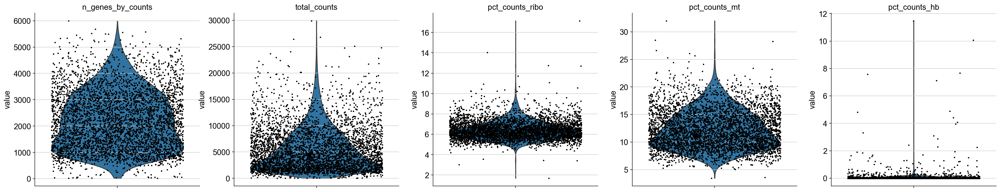

In [12]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

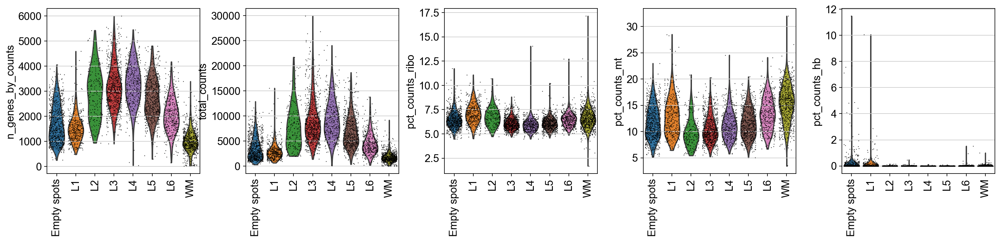

In [13]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1`, и `WM` слоёв. Поэтому хотелось бы быть с ними аккуратнее. Хочется заметить высокий процент митохондриальных генов в `L1` и `L2`

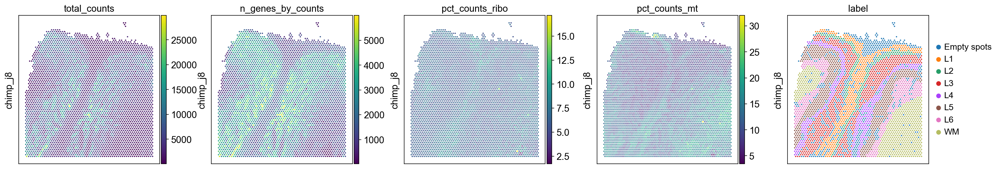

In [14]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

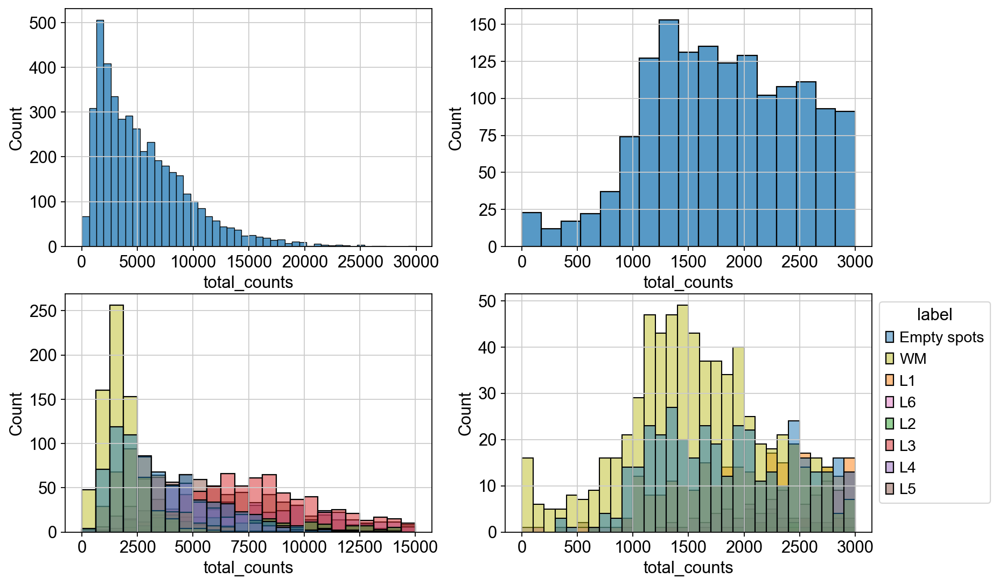

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `WM`. Посмотрим на остальные споты

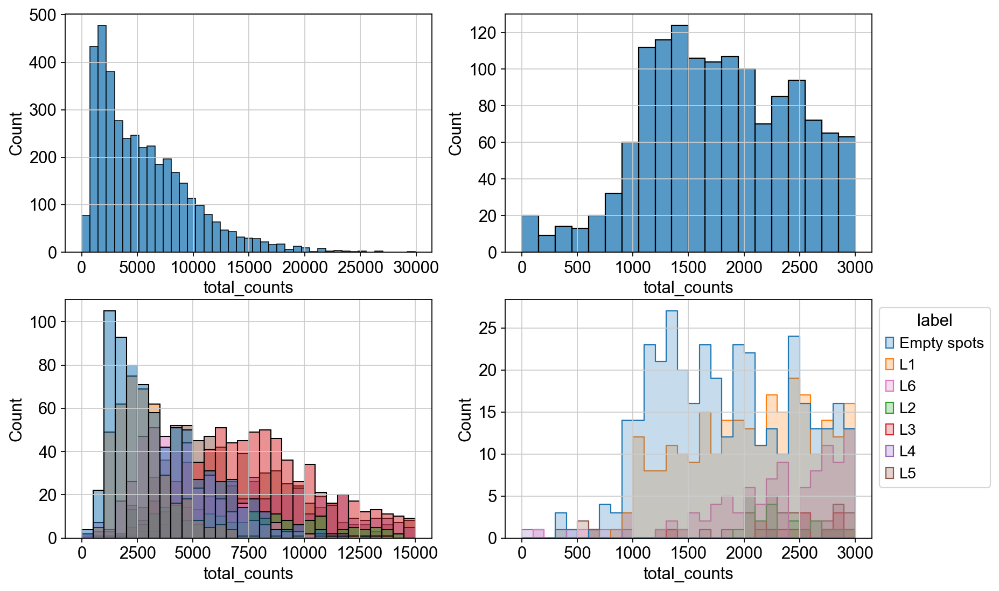

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [17]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts')

median = 4505.0, [-5061.237548828125, 14071.237548828125]


In [18]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 900) & (adata.obs['total_counts'] < 25000)) |
                            ((adata.obs['total_counts'] > 400) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=62

label
WM             32
Empty spots    12
L6              6
L3              4
L5              4
L1              2
L4              2
Name: label, dtype: int64


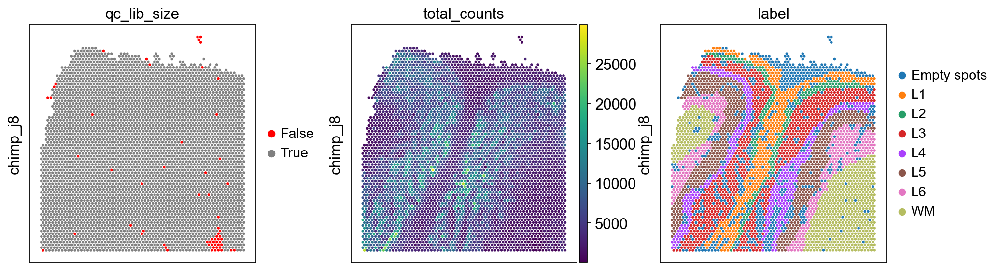

In [19]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

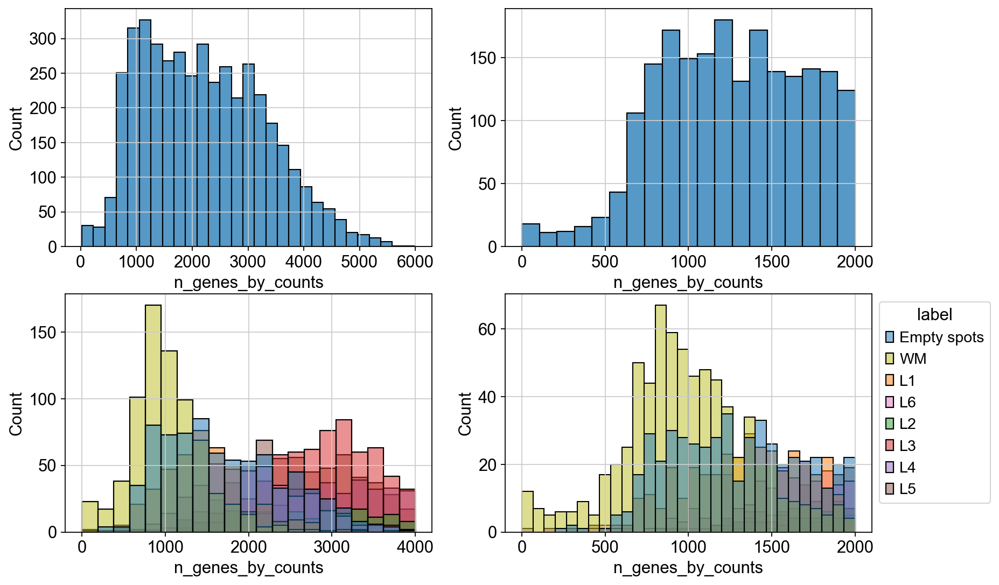

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `WM`. Посмотрим на остальные споты

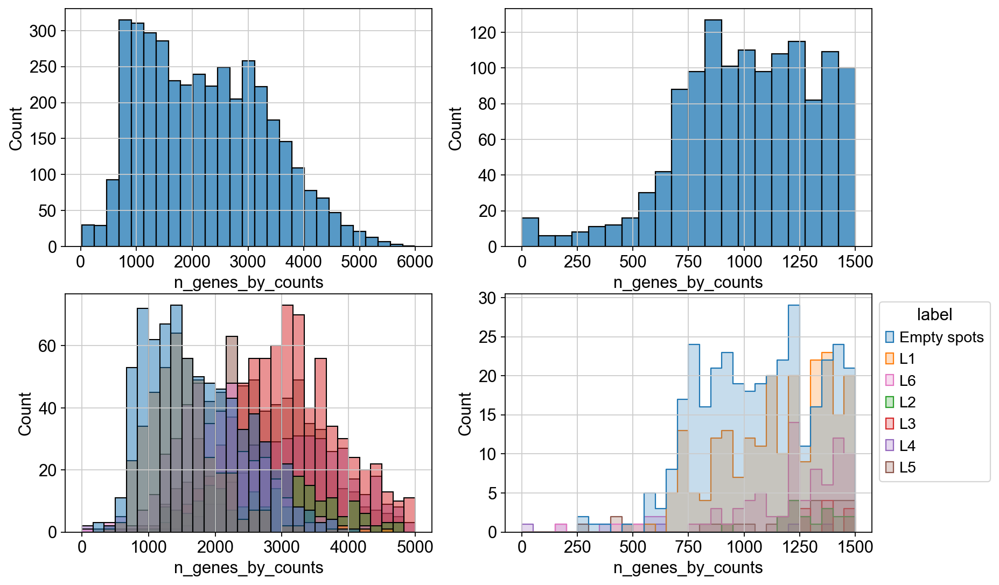

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 5000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='n_genes_by_counts', binrange=[0, 1500], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 1500], bins=30, hue='label', fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total n_genes_by_counts = 1000`. Поставим порог для `WM` и для всех остальных по отдельности

In [22]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 700) & (adata.obs.label != 'WM'))
                           | ((adata.obs['n_genes_by_counts'] > 400) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=90

label
WM             45
Empty spots    22
L6              9
L1              7
L5              4
L4              3
Name: label, dtype: int64


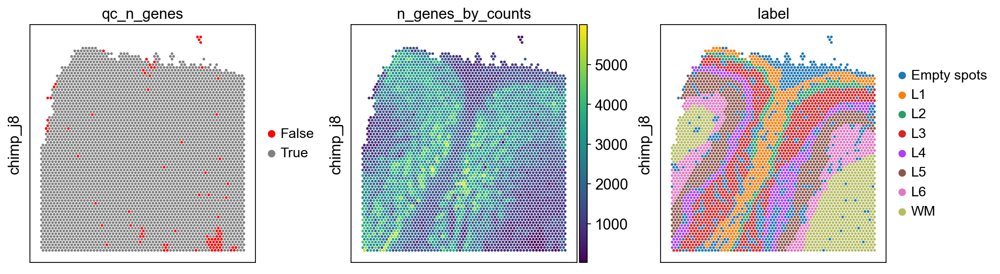

In [23]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

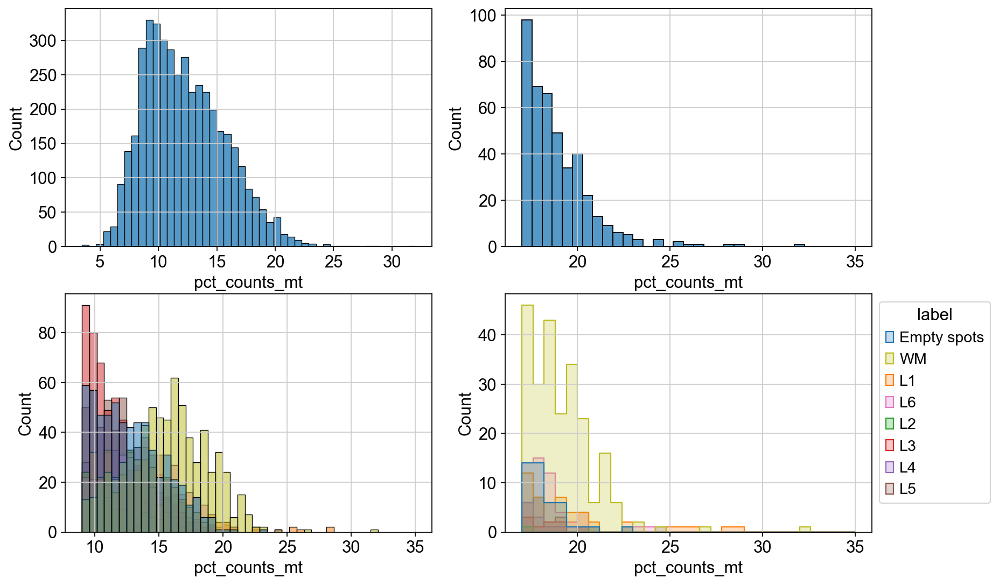

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[9, 35], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 35], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 35], hue='label', bins=30, hue_order=hue_order, ax=axs[1][1], fill=True, element="step", palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

In [25]:
adata.obs['qc_mt'] = ((adata.obs['pct_counts_mt'] <= 21)).astype('string')
#adata.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=43

label
WM             30
L1              7
L6              3
Empty spots     2
L4              1
Name: label, dtype: int64


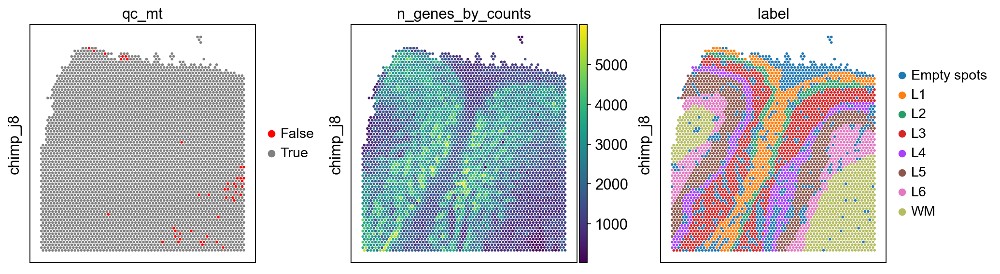

In [26]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_mt', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

Очень странный `L1` слой. Я бы сказал, что маловато митохондриальной экспрессии

### Proportion of ribosomal reads

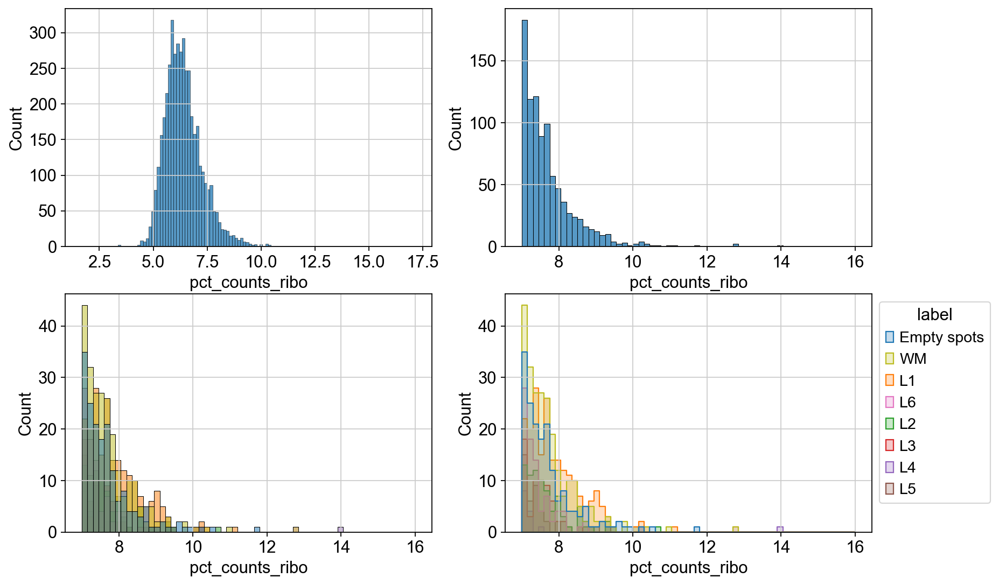

In [27]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD

In [28]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_ribo')

median = 6.284440040588379, [4.254625618457794, 8.314254462718964]


Выберем порог `pct_counts_ribo = 13`

In [29]:
adata.obs['qc_ribo'] = ((adata.obs['pct_counts_ribo'] <= 10)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=17

label
L1             5
WM             4
Empty spots    3
L2             2
L4             1
L5             1
L6             1
Name: label, dtype: int64


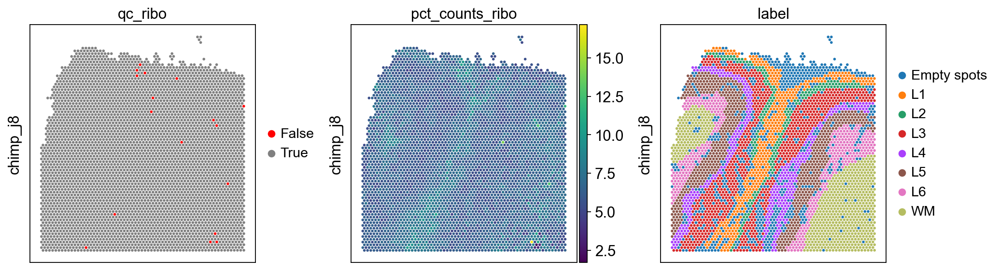

In [30]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

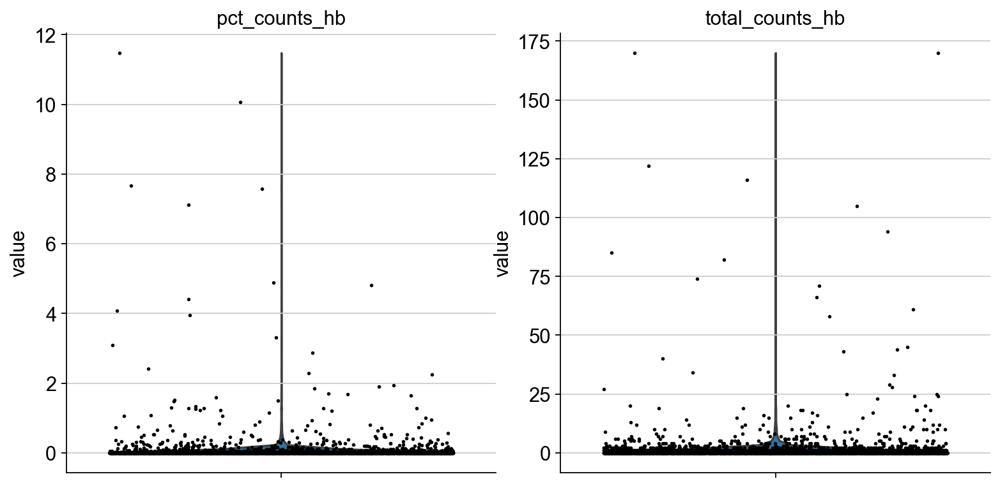

In [31]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Посчитаем 3MAD

In [32]:
median_pct, left_3mad_pct, right_3mad_pct = compute_3mad_intervals(adata.obs, 'pct_counts_hb')
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts_hb')

median = 0.0, [-0.23779119551181793, 0.23779119551181793]
median = 0.0, [-4.309138298034668, 4.309138298034668]


In [33]:
adata.obs['qc_hb'] = ((adata.obs['pct_counts_hb'] <= 1) &
                      (adata.obs['total_counts_hb'] <= 20)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_hb')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_hb'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=43

label
Empty spots    28
L1             11
L6              2
L3              1
WM              1
Name: label, dtype: int64


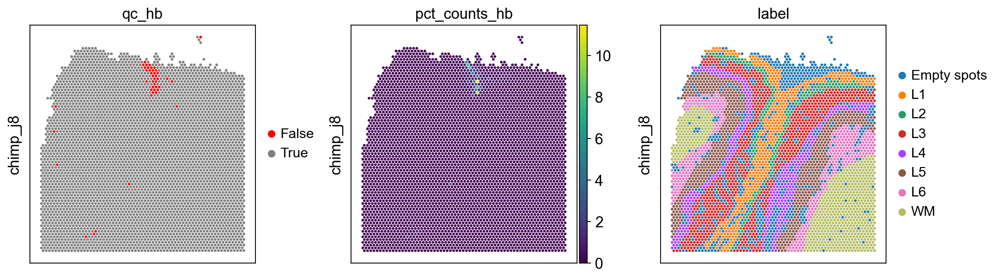

In [34]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [35]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)
adata.obs['qc_ribo'] = adata.obs['qc_ribo'].astype(object).replace(d)
adata.obs['qc_hb'] = adata.obs['qc_hb'].astype(object).replace(d)

In [36]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes *
                              adata.obs.qc_mt * adata.obs.qc_ribo * adata.obs.qc_hb).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=179

label
WM             70
Empty spots    51
L1             29
L6             14
L3              5
L5              5
L4              3
L2              2
Name: label, dtype: int64


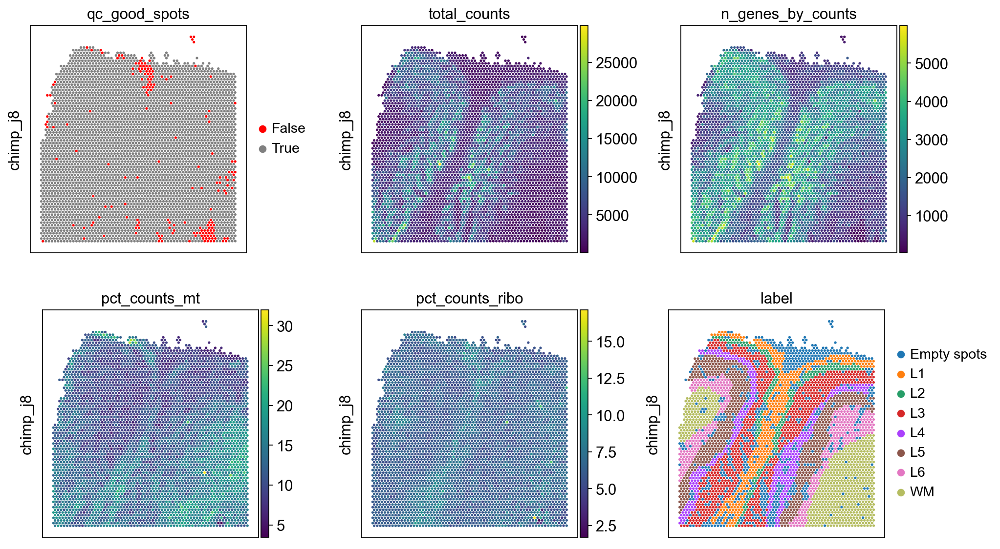

In [37]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

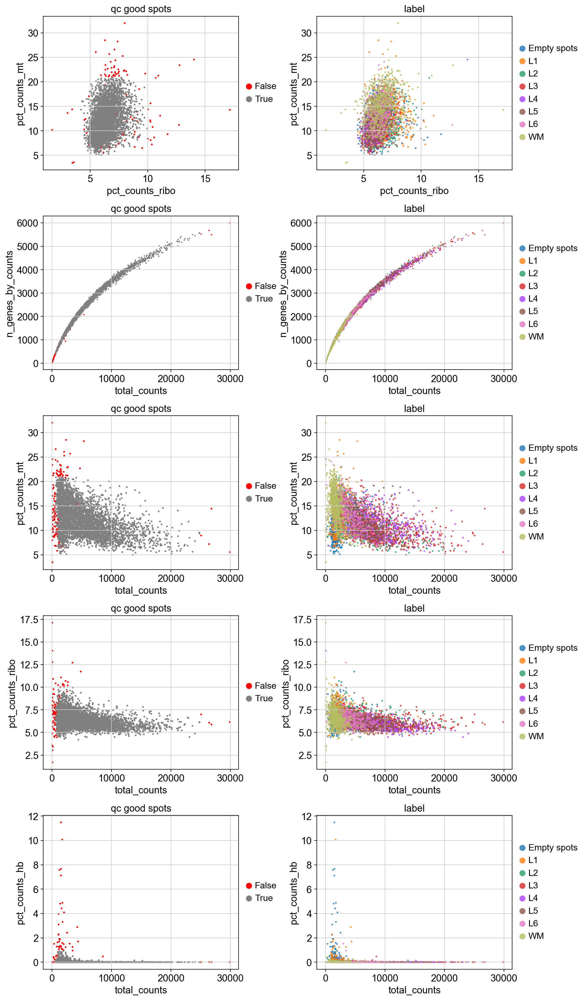

In [38]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты (без пустых)

In [39]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [40]:
adata_filtered = adata[good_spots].copy()

### PCA

In [41]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:33)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


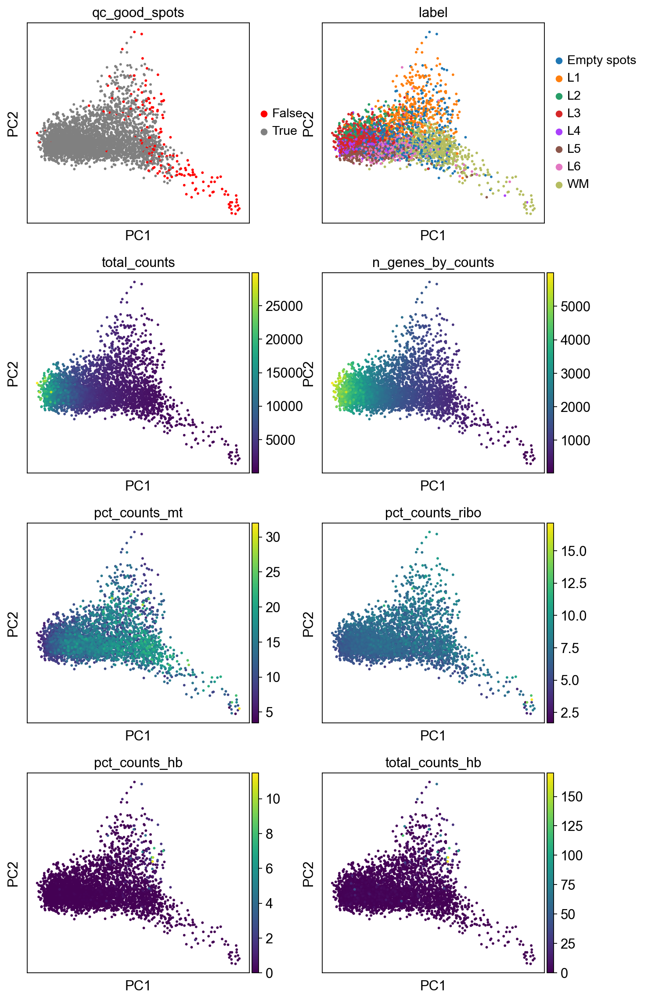

In [42]:
sc.pl.pca(adata, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=2, show=True)

## Сохраним в .h5ad

In [43]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt', 'qc_hb', 'qc_ribo'], axis=1, inplace=True)

In [44]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAAGTATCTCCCA-1,1,50,102,WM,chimp_j8,1895,3719.0,496.0,13.336919,0.0,0.000000,213.0,5.727346
AAACAGCTTTCAGAAG-1,1,43,9,L6,chimp_j8,1231,2063.0,241.0,11.682016,0.0,0.000000,142.0,6.883180
AAACAGGGTCTATATT-1,1,47,13,L6,chimp_j8,2565,5881.0,685.0,11.647679,2.0,0.034008,417.0,7.090631
AAACAGTGTTCCTGGG-1,1,73,43,L3,chimp_j8,4224,13488.0,1113.0,8.251780,1.0,0.007414,954.0,7.072954
AAACATGGTGAGAGGA-1,1,62,0,L5,chimp_j8,3649,11047.0,1875.0,16.972933,0.0,0.000000,635.0,5.748167


In [45]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/chimp', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/chimp/{file}.h5ad')